In [1]:
from glob import glob

In [3]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/cows.zip'
extract_to_path = '/content/cow_detection'

os.makedirs(extract_to_path, exist_ok=True)

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to_path)

In [4]:
import os
import xml.etree.ElementTree as ET

annotations_path = '/content/cow_detection/annotations.xml'
output_dir = '/content/cow_detection/Annotations'
os.makedirs(output_dir, exist_ok=True)

tree = ET.parse(annotations_path)
root = tree.getroot()

for image in root.findall('image'):
    image_name = image.get('name')
    width = int(image.get('width'))
    height = int(image.get('height'))

    annotation = ET.Element('annotation')
    ET.SubElement(annotation, 'filename').text = image_name
    size = ET.SubElement(annotation, 'size')
    ET.SubElement(size, 'width').text = str(width)
    ET.SubElement(size, 'height').text = str(height)
    ET.SubElement(size, 'depth').text = '3'

    for box in image.findall('box'):
        obj = ET.SubElement(annotation, 'object')
        ET.SubElement(obj, 'name').text = 'cow'
        bndbox = ET.SubElement(obj, 'bndbox')
        ET.SubElement(bndbox, 'xmin').text = str(int(float(box.get('xtl'))))
        ET.SubElement(bndbox, 'ymin').text = str(int(float(box.get('ytl'))))
        ET.SubElement(bndbox, 'xmax').text = str(int(float(box.get('xbr'))))
        ET.SubElement(bndbox, 'ymax').text = str(int(float(box.get('ybr'))))

    tree = ET.ElementTree(annotation)
    xml_filename = os.path.splitext(image_name)[0] + '.xml'

    full_output_path = os.path.join(output_dir, xml_filename)
    xml_file_directory = os.path.dirname(full_output_path)

    # Create the directory if it doesn't exist
    os.makedirs(xml_file_directory, exist_ok=True)

    # Write the XML file
    tree.write(full_output_path)

In [5]:
import xml.etree.ElementTree as ET
import os
import cv2

def voc_to_yolo_format(xml_file, image_width, image_height, class_mapping):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    yolo_annotations = []

    for obj in root.iter('object'):
        class_name = obj.find('name').text
        class_id = class_mapping.get(class_name, -1)

        if class_id == -1:
            continue

        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)

        x_center = (xmin + xmax) / 2 / image_width
        y_center = (ymin + ymax) / 2 / image_height
        width = (xmax - xmin) / image_width
        height = (ymax - ymin) / image_height

        yolo_annotations.append(f"{class_id} {x_center} {y_center} {width} {height}")

    return yolo_annotations

def convert_voc_to_yolo(dataset_path, image_folder, annotations_folder, class_mapping):
    image_files = os.listdir(image_folder)

    os.makedirs(os.path.join(dataset_path, 'labels'), exist_ok=True)

    for image_file in image_files:
        if image_file.endswith('.jpg') or image_file.endswith('.png'):
            xml_file = os.path.join(annotations_folder, image_file.replace('.jpg', '.xml').replace('.png', '.xml'))

            if os.path.exists(xml_file):
                image_path = os.path.join(image_folder, image_file)
                image = cv2.imread(image_path)
                image_height, image_width, _ = image.shape

                yolo_annotations = voc_to_yolo_format(xml_file, image_width, image_height, class_mapping)
                txt_file = os.path.join(dataset_path, 'labels', image_file.replace('.jpg', '.txt').replace('.png', '.txt'))
                with open(txt_file, 'w') as f:
                    f.write("\n".join(yolo_annotations))

class_mapping = {'cow' : 0}
dataset_path = '/content/cow_detection'
image_folder = '/content/cow_detection/images'
annotations_folder = '/content/cow_detection/Annotations/images'

convert_voc_to_yolo(dataset_path, image_folder, annotations_folder, class_mapping)


In [6]:
!pip install torch torchvision torchaudio
!pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 96.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 74.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 87.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [7]:
# Create dataset.yaml file for YOLOv5
yaml_content = """
train: /content/cow_detection/images
val: /content/cow_detection/images

nc: 1  # Number of classes (with_mask, without_mask,mask_weared_incorrect)
names: ['cow']
"""

with open('/content/dataset.yaml', 'w') as f:
    f.write(yaml_content)

In [8]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 28.7 MB/s eta 0:00:00


In [9]:
!git clone https://github.com/ultralytics/yolov5.git /content/yolov5

Cloning into '/content/yolov5'...
remote: Enumerating objects: 17483, done.
remote: Total 17483 (delta 0), reused 0 (delta 0), pack-reused 17483 (from 1)
Receiving objects: 100% (17483/17483), 16.58 MiB | 26.25 MiB/s, done.
Resolving deltas: 100% (11991/11991), done.


In [10]:
%cd /content/yolov5
!pip install -r requirements.txt

/content/yolov5


In [11]:
!ls /content/yolov5

benchmarks.py	 data	     LICENSE	     README.zh-CN.md   tutorial.ipynb
CITATION.cff	 detect.py   models	     requirements.txt  utils
classify	 export.py   pyproject.toml  segment	       val.py
CONTRIBUTING.md  hubconf.py  README.md	     train.py


In [12]:
!python3 /content/yolov5/train.py --img 640 --batch 16 --epochs 100 --data /content/dataset.yaml --weights yolov5s.pt

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-05-27 10:33:20.679406: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748342000.948710    1419 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748342001.020948    1419 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS wh

In [17]:
!python3 /content/yolov5/val.py --weights /content/yolov5/runs/train/exp/weights/best.pt --data /content/dataset.yaml --img 640 --task val

val: data=/content/dataset.yaml, weights=['/content/yolov5/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/cow_detection/labels.cache... 50 images, 1 backgrounds, 0 corrupt: 100% 51/51 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 2/2 [00:04<00:00,  2.07s/it]
                   all         51       1011      0.913      0.818      0.918      0.565
Speed: 0.3ms pre-process, 10.7ms inference, 9.0ms NMS per image at shape (32, 3, 640, 640)
Results saved to run

In [20]:
!python3 /content/yolov5/detect.py --weights  /content/yolov5/runs/train/exp/weights/best.pt --img 640 --source /content/cow_detection/images/10.png

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/cow_detection/images/10.png, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/cow_detection/images/10.png: 448x640 12 cows, 27.3ms
Speed: 0.5ms pre-process, 27.3ms inference, 132.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp4


In [21]:
import cv2
from matplotlib import pyplot as plt
from IPython.display import Image
from ultralytics import YOLO

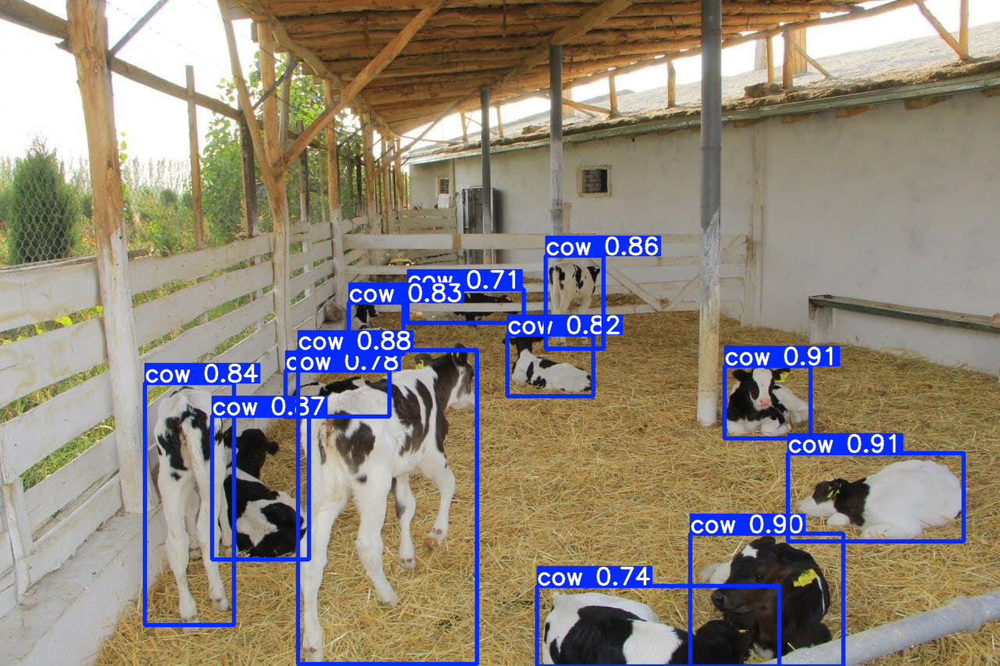

In [22]:
img = cv2.imread('/content/yolov5/runs/detect/exp4/10.png')
from google.colab.patches import cv2_imshow

cv2_imshow(img)

In [23]:
!python3 /content/yolov5/detect.py --weights  /content/yolov5/runs/train/exp/weights/best.pt --img 640 --source /content/i1.jpg

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/i1.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/i1.jpg: 448x640 3 cows, 42.2ms
Speed: 0.5ms pre-process, 42.2ms inference, 153.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp5


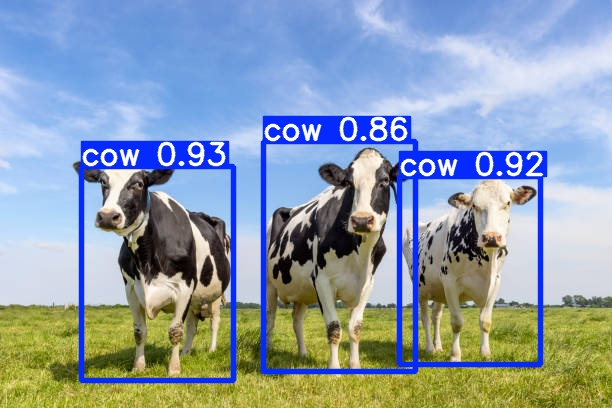

In [24]:
img = cv2.imread('/content/yolov5/runs/detect/exp5/i1.jpg')
from google.colab.patches import cv2_imshow

cv2_imshow(img)

In [25]:
!python3 /content/yolov5/detect.py --weights  /content/yolov5/runs/train/exp/weights/best.pt --img 640 --source /content/i2.jpg

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/i2.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/i2.jpg: 448x640 1 cow, 27.7ms
Speed: 0.5ms pre-process, 27.7ms inference, 110.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp6


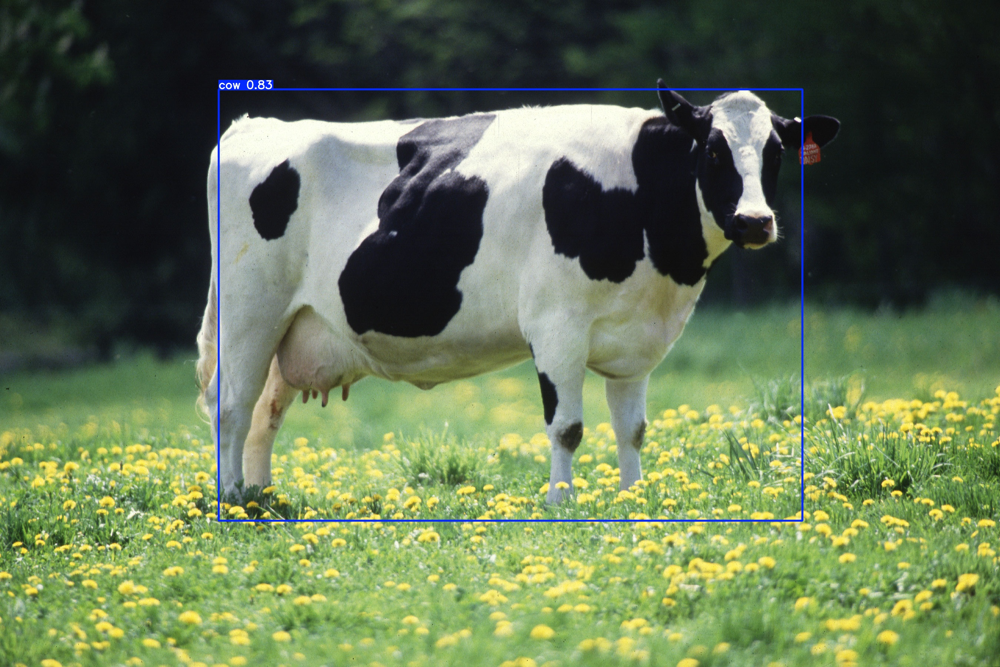

In [26]:
img = cv2.imread('/content/yolov5/runs/detect/exp6/i2.jpg')
from google.colab.patches import cv2_imshow

cv2_imshow(img)

In [28]:
!cp /content/yolov5/runs/train/exp/weights/best.pt /content/yolov5_best_model.pt

In [31]:
from google.colab import files
files.download('/content/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>